# Pré-processamento

In [53]:
import tensorflow as tf
# Importante verificar a compatibilidade caso queira carregar o modelo pré/semi treinado
print(tf.__version__)

2.16.1


In [54]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [55]:
IMG_SIZE = 64
IMG_CHANNELS = 3
BATCH_SIZE = 128 # 64 > 128
PATH="/kaggle/input/animefacedataset"

In [56]:
dataset = tf.keras.utils.image_dataset_from_directory(
    PATH,
    labels=None,
    image_size=(IMG_SIZE, IMG_SIZE),  # Tamanho para redimensionar as imagens
    batch_size=BATCH_SIZE,            # Tamanho do batch (subconjunto do dataset)
    shuffle=True,                     # Embaralhar as imagens
    seed=42                           # Para resultados reprodutíveis
)

Found 63565 files.


In [57]:
@tf.function
def normalize_image(image):
    """
    Função para normalizar a imagem para o intervalo [-1, 1]
    Args:
        image (tf.Tensor): Imagem para ser normalizada.
    """
    image = tf.cast(image, tf.float32)  # Certifica-se de que os pixels são do tipo float32
    image = (image / 255.0) * 2 - 1     # Converte o intervalo [0, 1] para [-1, 1]

    return image

In [58]:
AUTOTUNE = tf.data.experimental.AUTOTUNE

dataset = dataset.map(normalize_image)    # Aplicação da função de normalização
dataset = dataset.prefetch(BATCH_SIZE*2)  # Prefetch para otimizar a leitura de dados

(128, 64, 64, 3)
(64, 64, 3)


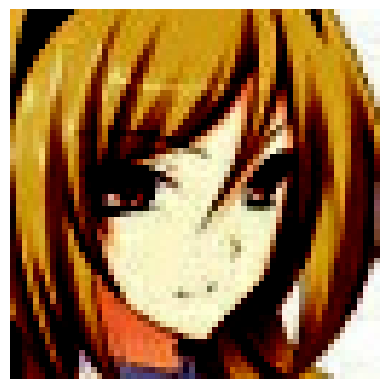

-1.0 1.0


In [59]:
for i in dataset:
    print(i.shape)
    print(i[0].shape)

    plt.imshow(i[0])
    plt.axis('off')
    plt.show()

    print(np.min(i[0]), np.max(i[0]))
    break


# Arquitetura Gerador/Discriminador

In [60]:
# Configura o formato do tensor de imagem (batch_size, height, width, channels)
tf.keras.backend.set_image_data_format('channels_last')

In [61]:
# inicializador para pesos em uma camada da RN utilizando uma distribuição normal
init = tf.keras.initializers.RandomNormal(stddev=0.02)

In [62]:
def build_generator(NOISE_DIM=100):
    generator = keras.models.Sequential([
        layers.Dense(4*4*1024, kernel_initializer=init, input_dim=NOISE_DIM),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Reshape(target_shape=(4, 4, 1024)),
        
        layers.Conv2DTranspose(512, 3, strides=2, padding="same", use_bias=False, kernel_initializer=init),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        
        layers.Conv2DTranspose(256, 3, strides=2, padding="same", use_bias=False, kernel_initializer=init),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        
        layers.Conv2DTranspose(128, 3, strides=2, padding="same", use_bias=False, kernel_initializer=init),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        
        layers.Conv2DTranspose(64, 3, strides=2, padding="same", use_bias=False,kernel_initializer=init),
        layers.LeakyReLU(),
        # Função de ativação ideal para valores no intervalo [-1, 1]
        layers.Conv2DTranspose(3, 3, activation="tanh", padding="same")
    ])

    generator.summary()
    return generator

In [ ]:
def build_discriminator():
    discriminator = keras.models.Sequential([
        keras.layers.InputLayer(input_shape=(64, 64, 3)),

        layers.Conv2D(128, 3, strides=2, padding="same", use_bias=False, kernel_initializer=init),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2D(256, 3, strides=2, padding="same", use_bias=False, kernel_initializer=init),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(.25),

        layers.Conv2D(512, 3, strides=2, padding="same", use_bias=False, kernel_initializer=init),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(.25),
        
        layers.Conv2D(1024, 3, strides=2, padding="same", use_bias=False, kernel_initializer=init),
        layers.LeakyReLU(),

        layers.Flatten(),
        layers.Dense(1, activation="sigmoid")
    ])

    discriminator.summary()
    return discriminator

# Arquitetura GAN

In [64]:
import os
import PIL
import sys
import glob
import json
import time
import keras
import imageio
import warnings
import numpy as np
from IPython import display
from tensorflow.keras import layers
from tensorflow.train import Checkpoint

In [ ]:
# tf.config.run_functions_eagerly(True)  # Força execução imediata (sem otimização)
class GAN:
    """
    Classe que implementa uma Rede Generativa Adversarial (GAN), integrando as arquiteturas de
    gerador e discriminador.
    
    Atributos principais:
        generator (tf.keras.Model): Modelo do gerador da GAN.
        discriminator (tf.keras.Model): Modelo do discriminador da GAN.
        generator_optimizer (tf.keras.optimizers.Adam): Otimizador para o gerador.
        discriminator_optimizer (tf.keras.optimizers.Adam): Otimizador para o discriminador.
        history (dict): Histórico de perdas e acurácias do gerador e discriminador.
    """
    def __init__(self, build_generator, build_discriminator, GEN_LR=0.00002, DISC_LR=0.00001,
                 BATCH_SIZE=64, NOISE_DIM=100, EPOCHS=100):
        """
        Args:
            build_generator (function): Função que constrói a arquitetura do gerador.
            build_discriminator (function): Função que constrói a arquitetura do discriminador.
            GEN_LR (float): Taxa de aprendizado do gerador. Default é 0.00002.
            DISC_LR (float): Taxa de aprendizado do discriminador. Default é 0.00001.
            BATCH_SIZE (int): Tamanho do batch de treinamento. Default é 64.
            NOISE_DIM (int): Dimensão do vetor de ruído. Default é 100.
            EPOCHS (int): Número de épocas de treinamento. Default é 100.
        """
        self.BATCH_SIZE = BATCH_SIZE
        self.NOISE_DIM = NOISE_DIM
        self.EPOCHS = EPOCHS
    
        self.generator = build_generator(self.NOISE_DIM)
        self.discriminator = build_discriminator()

        self.cross_entropy = keras.losses.BinaryCrossentropy(from_logits=False)
        self.generator_optimizer =     keras.optimizers.Adam(learning_rate=GEN_LR)
        self.discriminator_optimizer = keras.optimizers.Adam(learning_rate=DISC_LR)

        self.history = {
            "discriminator_loss": [],
            "discriminator_accuracy": [],
            "generator_loss": [],
            "generator_accuracy": []
        }
    
    def adjust_lr(self, avg_disc_loss, avg_gen_loss, tolerance=0.1, min_lr=1e-8):
        """
        Ajusta dinamicamente o LR com base na razão nas métricas de perda.
        Args:
            avg_disc_loss (float): Perda média do discriminador.
            avg_gen_loss (float): Perda média do gerador.
            tolerance (float): Margem de tolerância para o ajuste.
            min_lr (float): Valor mínimo permitido para o learning rate.
        """
        gen_lr = self.generator_optimizer.learning_rate.numpy()
        disc_lr = self.discriminator_optimizer.learning_rate.numpy()
        # Calcula a razão entre as perdas
        ratio = avg_gen_loss / (avg_disc_loss + 1e-8)  # Evita divisão por zero

        # Ajusta apenas se a razão estiver fora da margem de tolerância
        if ratio > (1 + tolerance):  # Gerador está fraco
            new_disc_lr = max(min_lr, disc_lr * 0.9)  # Reduz LR do discriminador
            self.discriminator_optimizer.learning_rate.assign(new_disc_lr)
            print(f"Reduzindo LR do discriminador: {disc_lr} -> {new_disc_lr}")

        elif ratio < (1 - tolerance):  # Discriminador está muito forte
            new_gen_lr = max(min_lr, gen_lr * 0.9)  # Reduz LR do gerador
            self.generator_optimizer.learning_rate.assign(new_gen_lr)
            print(f"Reduzindo LR do gerador: {gen_lr} -> {new_gen_lr}")

        else:
            # Ambos os modelos estão equilibrados, pode-se optar por reduzir suavemente os LRs
            new_gen_lr = gen_lr * .95
            new_disc_lr = disc_lr * .95

            self.generator_optimizer.learning_rate.assign(new_gen_lr)
            self.discriminator_optimizer.learning_rate.assign(new_disc_lr)
            print(f"Reduzindo LR de ambos: Gerador = {new_gen_lr}, Discriminador = {new_disc_lr}")

    # loss funcs
    def generator_loss(self, fake_output):
        """
        Retorna o valor de perda do gerador em um batch.
        Args:
            fake_output (tf.Tensor): Imagens feitas pelo gerador
        """
        return self.cross_entropy(tf.ones_like(fake_output), fake_output)

    def discriminator_loss(self, real_output, fake_output):
        """
        Retorna o valor de perda do discriminador em um batch.
        Args:
            fake_output (tf.Tensor): Imagens feitas pelo gerador.
            real_output (tf.Tensor): Imagens do reais do dataset.
        """
        real_loss = self.cross_entropy(tf.ones_like(real_output), real_output)
        fake_loss = self.cross_entropy(tf.zeros_like(fake_output), fake_output)
        total_loss = float(real_loss) + float(fake_loss)
        return total_loss

    @tf.function
    def disc_acc(self, t_preds, f_preds=None):
        """
        Cálculo da métrica de acurácia do discriminador.
        Args:
            t_preds (tf.Tensor): Previsões do discriminador das imagens reais.
            f_preds (tf.Tensor): Previsões do discriminador das imagens feitas pelo gerador.
        """
        preds = t_preds if f_preds is None else tf.concat([f_preds, t_preds], axis=0)

        preds = tf.greater(preds, .5)
        preds = tf.cast(preds, tf.float32)

        return tf.reduce_mean(preds)

    @tf.function
    def gen_acc(self, preds):
        """
        Cálculo da métrica de acurácia do gerador.
        Args:
            preds (tf.Tensor): Previsões do discriminador das imagens feitas pelo gerador.
        """
        preds = tf.greater(preds, .5)
        preds = tf.cast(preds, tf.float16)
    
        # Normalizando a acurácia e retornando como float
        return tf.reduce_mean(preds)
    
    def catch_losses_mean(self, epochs_num=1, verbose=None):
        """
        Retorna a média de loss das últimas {epochs_num} épocas.
        Args:
            epochs_num (int): Número de épocas para calcular a média
            verbose (bool): Exibe as médias obtidas na saída stdout.
        """
        disc_losses = self.history["discriminator_loss"][-epochs_num:]
        gen_losses  = self.history["generator_loss"][-epochs_num:]
    
        if not disc_losses or not gen_losses:
            warnings.warn("AVISO: Histórico vazio ou insuficiente para o número de perdas solicitado.")

        # Calculo das as médias
        avg_disc_loss = np.mean(disc_losses)
        avg_gen_loss  = np.mean(gen_losses)
        if verbose:
            print(f"Média de perda do discriminador: {avg_disc_loss:.5f}")
            print(f"Média de perda do gerador: {avg_gen_loss:.5f}")

        return avg_disc_loss, avg_gen_loss

    def generate_and_save_images(self, epoch, num_images=9, path=None, verbose=None):
        """
        Salva uma imagem com as amostras feitas pelo gerador.
        Args:
            epoch (int): Número da época para salvar no nome da imagem gerada.
            num_images (int): Número de amostras que serão geradas.
            path (str): Diretório para salvar a imagem.
            verbose (bool): Se True exibe o caminho relativo onde a imagem foi salva.
        """
        path = os.path.join(path, 'generated_images') if path else os.path.join('generated_images')
        os.makedirs(path, exist_ok=True)
        
        fig_name = f"image_at_epoch_{epoch}.png" if epoch else 'generated_image.png'
        fig_name = os.path.join(path, fig_name)
        
        # Gerando as imagens
        noise = tf.random.normal([num_images, self.NOISE_DIM])
        generated_images = self.generator(noise, training=False)

        # 'Desnormalização' das imagens geradas [-1, 1] -> [0, 255]
        generated_images = (generated_images + 1) * 127.5
        generated_images = np.clip(generated_images, 0, 255)
        generated_images = generated_images.astype(np.uint8)

        # Tamanho da grade
        grid_size = int(np.sqrt(num_images))
        plt.figure(figsize=(grid_size, grid_size))

        # Adiciona as imagens à grade
        for i in range(grid_size):
            for j in range(grid_size):
                idx = i * grid_size + j
                plt.subplot(grid_size, grid_size, idx + 1)
                plt.imshow(generated_images[idx])
                plt.axis('off')

        plt.savefig(fig_name, dpi=300, bbox_inches='tight', pad_inches=0.1)
        plt.show()
        if verbose:
          print('Imagem salva em: ', path)

    def save_model(self, epoch=1, path=None, verbose=None):
        """
        Serializa e salva ambos os modelos (gerador e discriminador) no formato .keras

        Args:
            epoch (int): Inserido nos nomes dos arquivos para identificar a época em que foram salvos.
            path (str): Diretório onde os arquivos serão salvos.
            verbose (bool): Exibe as informações dos arquivos salvos.
        """
        path = path if path else 'checkpoint'
        os.makedirs(path, exist_ok=True)
        
        name = lambda s,x: f"{s}_at_epoch_{x}.keras"
        generator_name = os.path.join(path, name('generator', epoch))
        discriminator_name = os.path.join(path, name('discriminator', epoch))

        self.discriminator.save(discriminator_name)
        if verbose:
            print(f"Discriminador salvo em: {discriminator_name}")

        self.generator.save(generator_name)
        if verbose:    
            print(f"Gerador salvo em: {discriminator_name}")

        # with open('gan_losses.json', 'w') as f:
        #     json.dump(self.history, f)
    
    def load_model(self, discriminator_path, generator_path, verbose=None):
        """
        Restaura ambos os modelos (gerador e discriminador) carregando seus respectivos arquivos .keras
        Args:
            discriminator_path (str): Endereço do arquivo do discriminador.
            generator_path (str): Endereço do arquivo do gerador.
            verbose (bool): Exibe as informações de carregamento.
        """
        self.generator = keras.models.load_model(generator_path)
        if verbose:
            print("Gerador carregado.")
        self.discriminator= keras.models.load_model(discriminator_path)
        if verbose:
            print("Discriminador carregado.")
        
    @tf.function
    def train_step(self, images, extra_step=None):
        """
        Processo de um passo do treinamento da GAN.
        Args:
            images (tensor): Conjunto de imagens (batch) do Dataset.
            extra_step (bool): Ativa um passo de treinamento extra para o discriminador com o dataset real.
        """
        noise = tf.random.normal(shape=(self.BATCH_SIZE, self.NOISE_DIM))
        gen_loss, disc_loss = None, None
        gen_acc, disc_acc = None, None

        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            fake_imgs = self.generator(noise, training=True)

            # predições do discriminador (com imagens reais e sintéticas)
            real_output = self.discriminator(images, training=True)
            fake_output = self.discriminator(fake_imgs, training=True)

            if extra_step:
                real_output = tf.concat([real_output, self.discriminator(images, training=True)], axis=0)
                fake_output = tf.concat([fake_output, self.discriminator(fake_imgs, training=True)], axis=0)

            # calculando as métricas de loss
            gen_loss = self.generator_loss(fake_output)
            disc_loss = self.discriminator_loss(real_output, fake_output)

            # calculando as métricas de acurácia
            disc_acc = self.disc_acc(real_output, fake_output)
            gen_acc = self.gen_acc(fake_output)

        # Salvando e atualizando os gradientes
        generator_grads = gen_tape.gradient(gen_loss, self.generator.trainable_weights)
        self.generator_optimizer.apply_gradients(zip(generator_grads, self.generator.trainable_weights))

        discriminator_grads = disc_tape.gradient(disc_loss, self.discriminator.trainable_weights)
        self.discriminator_optimizer.apply_gradients(zip(discriminator_grads, self.discriminator.trainable_weights))

        return disc_loss, disc_acc, gen_loss, gen_acc

    def train(self, dataset, epochs=None, epoch_to_adjust_lr=5, epochs_checkpoint=10, path=None):
        """
        Unifica e realiza todos os processos para o treinamento da GAN.
        Args:
            dataset (tf.data.Dataset): Imagens para o treinamento.
            epochs (int): Número de vezes que o modelo passará por todo o dataset.
            epoch_to_adjust_lr (int): Número de épocas para percorrer antes de ajustar o lr.
            epochs_checkpoint (int): Número de épocas até salvar um Checkpoint.
            path (str): Caminho para salvar os arquivos gerados durante o treinamento
        """
        epochs = epochs if epochs else self.EPOCHS
        
        for epoch in range(epochs):
            start = time.time()
            
            if epoch:
                avg_disc_loss, avg_gen_loss = self.catch_losses_mean()
                ratio = avg_gen_loss / avg_disc_loss
                print(f'avg_disc_loss: {avg_disc_loss:.4f}\tavg_gen_loss: {avg_gen_loss:.4f}')
                print(f'Ratio (generator_loss_at_epoch_{epoch} / generator_loss_at_epoch_{epoch}): {ratio:.2f}')
            else:
                ratio = 0
            # Cria listas vazias no histórico para adicionar novos valores da nova época.
            self.history["discriminator_loss"].append([])
            self.history["discriminator_accuracy"].append([])
            self.history["generator_loss"].append([])
            self.history["generator_accuracy"].append([])
            
            for image_batch in dataset:
                disc_loss, disc_acc, gen_loss, gen_acc = (self.train_step(image_batch, extra_step=False)
                                                          if ratio > 2
                                                          else
                                                          self.train_step(image_batch, extra_step=True))
                
                self.history["discriminator_loss"][-1].append(disc_loss)
                self.history["discriminator_accuracy"][-1].append(disc_acc)
                self.history["generator_loss"][-1].append(gen_loss)
                self.history["generator_accuracy"][-1].append(gen_acc)
                
                sys.stdout.write(f"\rGenerator_loss: {gen_loss:.5f}\tDiscriminator_loss: {disc_loss:.5f}\tGenerator_accuracy: {gen_acc:.5f}\tDiscriminator_accuracy:{disc_acc:.5f}")
                
            display.clear_output(wait=True)
            self.generate_and_save_images(epoch + 1, path=path)
            
            # salva o modelo no atual estado
            if not (epoch + 1) % epochs_checkpoint:
                self.save_model(epoch=epoch+1, verbose=True, path=path)

            # Ajuste de lr
            if not (epoch + 1) % epoch_to_adjust_lr:
                disc_loss, gen_loss = self.catch_losses_mean(epochs_num=epoch_to_adjust_lr, verbose=True)
                self.adjust_lr(avg_disc_loss=disc_loss, avg_gen_loss=gen_loss)

            epoch_time = time.time()-start
            print(f"Tempo para a época {epoch+1}: {epoch_time:.2f}s.")
            
            estimated_time = epoch_time * (epochs - epoch)
            sys.stdout.write(f"Tempo estimado para conclusão do treinamento: ~{round(estimated_time/60)}min\n")
            
            # barra de progresso simples
            x = int(np.round((100 * (epochs - (epoch + 1))) / epochs))
            sys.stdout.write(f"\r[{'█' * (100-x)}{'-' * x}]\n")
        
        # Generate after the final epoch
        display.clear_output(wait=True)
        self.generate_and_save_images(epoch + 1)

# Instanciação e Treinamento da GAN

In [66]:
gan = GAN(build_generator, build_discriminator, EPOCHS=100, NOISE_DIM=100, BATCH_SIZE=BATCH_SIZE, GEN_LR=0.00003, DISC_LR=0.00001)

Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 16384)          │     1,654,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_98          │ (None, 16384)          │        65,536 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_126 (LeakyReLU)     │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_14 (Reshape)            │ (None, 4, 4, 1024)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_70             │ (None, 8, 8, 512)      │     4,718,592 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_99          │ (None, 8, 8, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_127 (LeakyReLU)     │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_71             │ (None, 16, 16, 256)    │     1,179,648 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_100         │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_128 (LeakyReLU)     │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_72             │ (None, 32, 32, 128)    │       294,912 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_101         │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_129 (LeakyReLU)     │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_73             │ (None, 64, 64, 64)     │        73,728 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_130 (LeakyReLU)     │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_74             │ (None, 64, 64, 3)      │         1,731 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,992,515 (30.49 MB)

 Trainable params: 7,957,955 (30.36 MB)

 Non-trainable params: 34,560 (135.00 KB)

Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_56 (Conv2D)              │ (None, 32, 32, 128)    │         3,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_131 (LeakyReLU)     │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_102         │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_57 (Conv2D)              │ (None, 16, 16, 256)    │       294,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_132 (LeakyReLU)     │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_103         │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_28 (Dropout)            │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_58 (Conv2D)              │ (None, 8, 8, 512)      │     1,179,648 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_133 (LeakyReLU)     │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_104         │ (None, 8, 8, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_29 (Dropout)            │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_59 (Conv2D)              │ (None, 4, 4, 1024)     │     4,718,592 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_134 (LeakyReLU)     │ (None, 4, 4, 1024)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_14 (Flatten)            │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 1)              │        16,385 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,216,577 (23.71 MB)

 Trainable params: 6,214,785 (23.71 MB)

 Non-trainable params: 1,792 (7.00 KB)

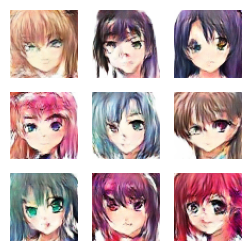

In [67]:
gan.train(dataset, epochs=100, epoch_to_adjust_lr=5, epochs_checkpoint=10)

# Resultados

## Imagens geradas

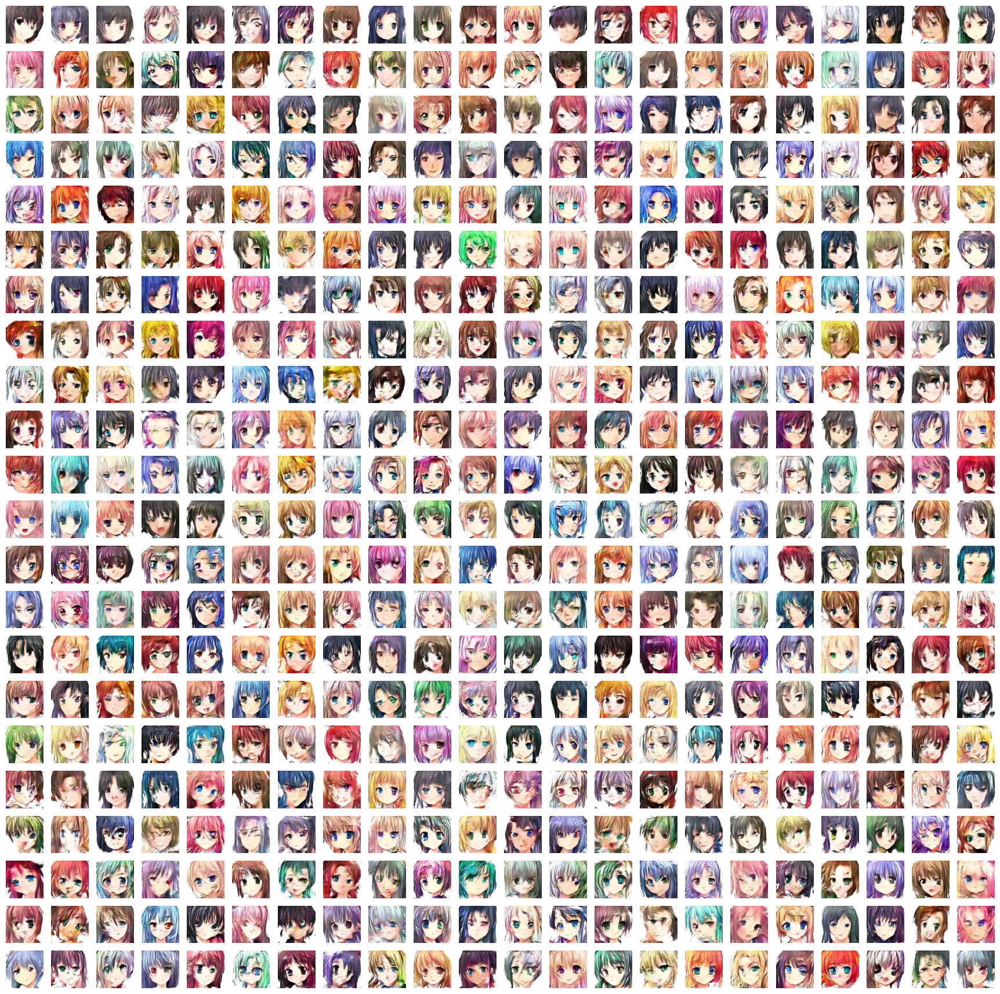

In [ ]:
num_images = 512

# Geração das imagens
noise = tf.random.normal([num_images, gan.NOISE_DIM])
generated_images = gan.generator(noise, training=False)

# 'desnormalização' das imagens
generated_images = (generated_images + 1) * 127.5
generated_images = np.clip(generated_images, 0, 255).astype(np.uint8)

# Número de linhas e colunas para a grade
grid_size = int(np.sqrt(num_images))

plt.figure(figsize=(grid_size, grid_size))

# Adiciona as imagens à grade
for i in range(grid_size):
    for j in range(grid_size):
        idx = i * grid_size + j
        plt.subplot(grid_size, grid_size, idx + 1)
        plt.imshow(generated_images[idx])
        plt.axis('off')

plt.savefig(f'high_res_generated_images.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

In [ ]:
# Exibição de cada imagem individualmente pela sua época
def display_image(epoch_no):
    return PIL.Image.open(f'images/image_at_epoch_{epoch_no}.png')

In [ ]:
# Gerando o GIF
anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('generated_images/image*.png')
    filenames = sorted(filenames)
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

/tmp/ipykernel_30/3048761545.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
/tmp/ipykernel_30/3048761545.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)



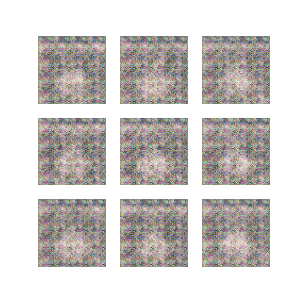

In [77]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

## Gráfico das métricas

In [ ]:
metrics = {i: [float(np.mean(j)) for j in gan.history[i]] for i in gan.history}
metrics['total_loss'] = [i + j for i, j in zip(metrics['generator_loss'], metrics['discriminator_loss'])]

discriminator_loss
discriminator_accuracy
generator_loss
generator_accuracy
total_loss


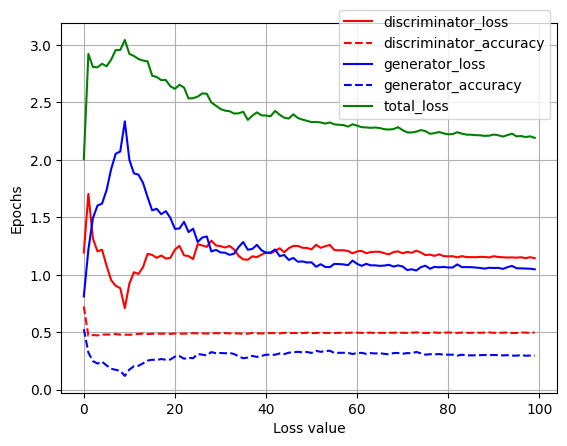

In [101]:
plt.figure("GAN metrics")
plt.grid()

lines = ['r', 'r--', 'b', 'b--', 'g']
for i, j in zip(metrics, lines):
    print(i)
    plt.plot(range(gan.EPOCHS), metrics[i], j)

plt.xlabel('Loss value')
plt.ylabel('Epochs')

plt.legend(metrics.keys(), loc="upper right", bbox_to_anchor=(1, 1.055))

plt.savefig("anime_face_gan_metrics.png")

plt.show()

In [ ]:
# Serialização das métricas
with open('gan_metrics.json', 'w') as f:
    json.dump(metrics, f)

# Treino extra

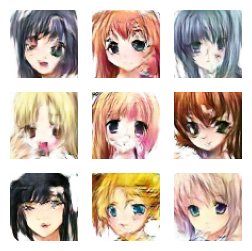

Discriminador salvo em: checkpoint/discriminator_at_epoch_40.keras
Gerador salvo em: checkpoint/discriminator_at_epoch_40.keras
Tempo para a época 40: 160.12s.
Tempo estimado para conclusão do treinamento: ~29min
[████████████████████████████████████████████████████████████████████████████████--------------------]
avg_disc_loss: 1.1210	avg_gen_loss: 1.0643
Ratio (generator_loss_at_epoch_40 / generator_loss_at_epoch_40):0.95
Generator_loss: 0.95557	Discriminator_loss: 1.15064	Generator_accuracy: 0.33203	Discriminator_accuracy:0.54102			

In [ ]:
gan.train(dataset, epochs=50, epoch_to_adjust_lr=25, epochs_checkpoint=10)

In [ ]:
metrics = {i: [float(np.mean(j)) for j in gan.history[i]] for i in gan.history}
# metrics['total_loss'] = [float(np.mean([x+y for x, y in zip(i, j)])) for i, j in zip(gan.history['discriminator_loss'], gan.history['generator_loss'])]
metrics['total_loss'] = [i + j for i, j in zip(metrics['generator_loss'], metrics['discriminator_loss'])]

In [ ]:
plt.figure("GAN metrics")
plt.grid()

lines = ['r', 'r--', 'b', 'b--', 'g']
for i, j in zip(metrics, lines):
    print(i)
    plt.plot(range(gan.EPOCHS + 50), metrics[i], j)

plt.xlabel('Loss value')
plt.ylabel('Epochs')

plt.legend(metrics.keys(), loc="upper right", bbox_to_anchor=(1, 1.055))

plt.savefig("anime_face_gan_metrics.png")

plt.show()